In [1]:
!pip install torch==1.3 torchvision==0.4.1 # Downgrading to be able to run the code. Run this before running all the code

     |████████████████████████████████| 773.1MB 23kB/s 
     |████████████████████████████████| 10.2MB 6.6MB/s 
ERROR: torchtext 0.9.1 has requirement torch==1.8.1, but you'll have torch 1.3.0 which is incompatible.
  Found existing installation: torch 1.8.1+cu101
    Uninstalling torch-1.8.1+cu101:
      Successfully uninstalled torch-1.8.1+cu101
  Found existing installation: torchvision 0.9.1+cu101
    Uninstalling torchvision-0.9.1+cu101:
      Successfully uninstalled torchvision-0.9.1+cu101


In [2]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.optim as optim
from torchvision import transforms, models

In [3]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')
data_path = '/content/drive/MyDrive/DL_Final_Project_Group3/data/'
results_path = '/content/drive/MyDrive/DL_Final_Project_Group3/results/'


Mounted at /content/drive


# Utility Functions

In [4]:
# image loader. It downsamples to 600x400 or 400x600
def load_image(img_path, max_size = 600,  shape=None):
  image = Image.open(img_path).convert('RGB')  
  
  if max(image.size) > max_size:
    size = max_size
  else:
    size = max(image.size)
	
  if shape is not None:
    size = shape
  
  resize_factor = 0
  #deciding vertical or horizontal
  if image.size[0] > image.size[1]:
    resize_factor = (int((2/3)*size), size)
  else:
    resize_factor = (size, int((2/3)*size))
  in_transform = transforms.Compose([
    transforms.Resize(resize_factor),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))]) # These values comes from the VGG19 original dataset
  
  image = in_transform(image)[:3, :, :].unsqueeze(0)
  
  return image

In [5]:
# Transforming tensor to numpy array to display an image
def im_convert(tensor):
  image = tensor.to("cpu").clone().detach()
  image = image.numpy().squeeze()
  image = image.transpose(1, 2, 0)
  image = image * np.array((0.229, 0.224, 0.225)) + np.array(
    (0.485, 0.456, 0.406))
  image = image.clip(0, 1)
  
  return image

In [6]:
# Get feature map of each layer. Conv4_2 is the content layer, whereas the rest are style layers
def get_features(image, model, layers=None):
  if layers is None:
    layers = {'0': 'conv1_1','5': 'conv2_1',
              '10': 'conv3_1',
              '19': 'conv4_1',
              '21': 'conv2_2',  ## content layer
              '28': 'conv5_1'}
  features = {}
  x = image
  for name, layer in enumerate(model.features):
    x = layer(x)
    if str(name) in layers:
      features[layers[str(name)]] = x
  
  return features

In [7]:
#Performing the gram_matrix
def gram_matrix(tensor):
  _, n_filters, h, w = tensor.size()
  tensor = tensor.view(n_filters, h * w)
  gram = torch.mm(tensor, tensor.t())
  
  return gram

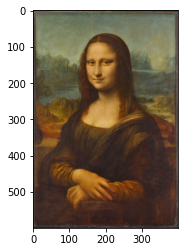

In [8]:
style = load_image(data_path+"gioconda.jpg")
#style = load_image(data_path+"homer.jpg")
style.shape
test = im_convert(style)
plt.imshow(test)

# Model Setup

In [9]:
torch.utils.model_zoo.load_url('https://download.pytorch.org/models/vgg19-dcbb9e9d.pth', model_dir=data_path) #downloading pretrained model

OrderedDict([('features.0.weight',
              tensor([[[[-5.3474e-02, -4.9257e-02, -6.7942e-02],
                        [ 1.5314e-02,  4.5068e-02,  2.1444e-03],
                        [ 3.6226e-02,  1.9999e-02,  1.9864e-02]],
              
                       [[ 1.7015e-02,  5.5403e-02, -6.2293e-03],
                        [ 1.4165e-01,  2.2705e-01,  1.3758e-01],
                        [ 1.2000e-01,  2.0030e-01,  9.2114e-02]],
              
                       [[-4.4885e-02,  1.2680e-02, -1.4497e-02],
                        [ 5.9742e-02,  1.3955e-01,  5.4102e-02],
                        [-9.6141e-04,  5.8304e-02, -2.9663e-02]]],
              
              
                      [[[ 2.6072e-01, -3.0489e-01, -5.0152e-01],
                        [ 4.1376e-01, -2.0831e-01, -4.9086e-01],
                        [ 5.8770e-01,  4.2851e-01, -1.3850e-01]],
              
                       [[ 2.8746e-01, -3.3338e-01, -4.5564e-01],
                        [ 3.7836e-01, -2

In [10]:
vgg = models.vgg19()
vgg.load_state_dict(torch.load(data_path+"vgg19-dcbb9e9d.pth"))

for param in vgg.parameters():
  param.requires_grad_(False)

In [11]:
for i, layer in enumerate(vgg.features):
  if isinstance(layer, torch.nn.MaxPool2d):
    vgg.features[i] = torch.nn.AvgPool2d(kernel_size=2, stride=2, padding=0)

In [12]:
torch.cuda.is_available()

True

In [13]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg.to(device).eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (17): ReLU(inplace=True)
    (18): AvgPool

# Loading the Content Image

In [14]:
content = load_image(data_path+"faces/7.PNG").to(device)
#content = load_image(data_path+"/altea.jpg").to(device)
style = style.to(device)

content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

In [15]:
content.shape

torch.Size([1, 3, 600, 400])

In [16]:
style_grams = {
  layer: gram_matrix(style_features[layer]) for layer in style_features}

In [17]:
target = torch.randn_like(content).requires_grad_(True).to(device)

# Loss Function of Artistic Style

In [18]:
style_weights = {'conv1_1': 0.2,
                 'conv2_1': 0.3,
                 'conv3_1': 0.4,
                 'conv4_1': 0.5,
                 'conv5_1': 0.6}

In [19]:
content_weight = 1000
style_weight = 100

# The Style Transfer Loop

In [20]:
#!pip install pyro
#import pyro
optimizer = optim.Adam([target], lr=0.01)

In [21]:
torch.autograd.set_detect_anomaly(True)

Iteration 50, Total loss: 962.98 - (content: 0.24, style 0.76)
Iteration 100, Total loss: 453.29 - (content: 0.22, style 0.78)
Iteration 150, Total loss: 320.98 - (content: 0.21, style 0.79)
Iteration 200, Total loss: 260.31 - (content: 0.2, style 0.8)
Iteration 250, Total loss: 224.84 - (content: 0.2, style 0.8)
Iteration 300, Total loss: 198.58 - (content: 0.21, style 0.79)
Iteration 350, Total loss: 176.88 - (content: 0.23, style 0.77)
Iteration 400, Total loss: 158.43 - (content: 0.26, style 0.74)
Iteration 450, Total loss: 140.75 - (content: 0.29, style 0.71)
Iteration 500, Total loss: 127.33 - (content: 0.33, style 0.67)
Iteration 550, Total loss: 117.74 - (content: 0.37, style 0.63)
Iteration 600, Total loss: 108.78 - (content: 0.39, style 0.61)
Iteration 650, Total loss: 103.51 - (content: 0.41, style 0.59)
Iteration 700, Total loss: 99.64 - (content: 0.44, style 0.56)
Iteration 750, Total loss: 95.44 - (content: 0.45, style 0.55)
Iteration 800, Total loss: 92.02 - (content: 0.

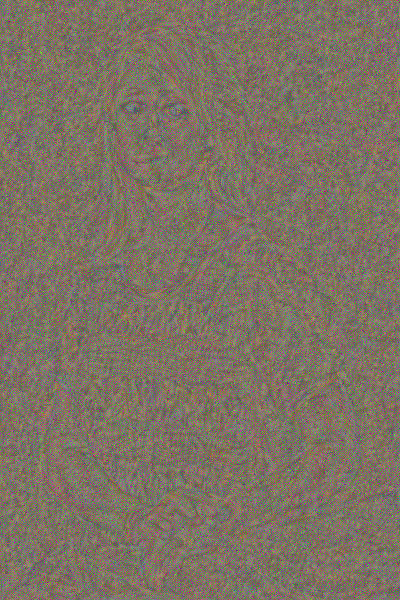

In [22]:
import imageio
from IPython.display import Image
interpolation_images = []
for i in range(1, 1000):
  optimizer.zero_grad()
  target_features = get_features(target, vgg)
  
  content_loss = torch.mean((target_features['conv2_2'] -
                             content_features['conv2_2']) ** 2)
  
  style_loss = 0
  for layer in style_weights:
    target_feature = target_features[layer]
    target_gram = gram_matrix(target_feature)
    _, d, h, w = target_feature.shape
    style_gram = style_grams[layer]
    layer_style_loss = style_weights[layer] * torch.mean(
      (target_gram - style_gram) ** 2)
    style_loss += layer_style_loss / (d * h * w)
    
    total_loss = content_weight * content_loss + style_weight * style_loss
    total_loss.backward(retain_graph=True)
    optimizer.step()
    
  if i % 50 == 0:
    total_loss_rounded = round(total_loss.item(), 2)
    content_fraction = round(
      content_weight*content_loss.item()/total_loss.item(), 2)
    style_fraction = round(
      style_weight*style_loss.item()/total_loss.item(), 2)
    print('Iteration {}, Total loss: {} - (content: {}, style {})'.format(
      i,total_loss_rounded, content_fraction, style_fraction))
    interpolation_images.append((final_img*255.0).astype(np.uint8))

  final_img = im_convert(target)


interpolation_images += interpolation_images[::-1]
imname = results_path+'/interpolation_image_girl3.gif'
imageio.mimsave(imname, interpolation_images, fps=25)

with open(imname,'rb') as f:
    display(Image(data=f.read(), format='png',width=512,height=512))

<Figure size 432x288 with 0 Axes>

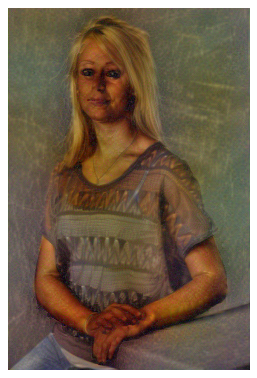

In [23]:
from matplotlib.pyplot import figure
fig = plt.figure()
figure(figsize=(8, 6), dpi=80)
plt.imshow(final_img)
plt.axis('off')
plt.savefig(results_path+'girl3_enhanced.jpeg')